Predicting fraud using email-data


# Data Collection/Processing: 

In [1]:
import pandas as pd
import numpy as np
import re
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, confusion_matrix

# Load the dataset
emails = pd.read_csv('emails.csv')

# Extract the message body from the 'message' column
def extract_body(message):
    body = re.search("\n\n([\s\S]*)", message)
    if body:
        return body.group(1)
    else:
        return ""

emails['body'] = emails['message'].apply(extract_body)

# Clean the text data
def clean_text(text):
    text = re.sub('[^a-zA-Z]', ' ', text)
    text = text.lower()
    return text

emails['clean_body'] = emails['body'].apply(clean_text)



# Data Exploration: Exploring the Email Dataset

**plot email communication graph/network** 
* each node is an email account
* the weight of an edge between two accounts depends on how many emails have been sent between them.

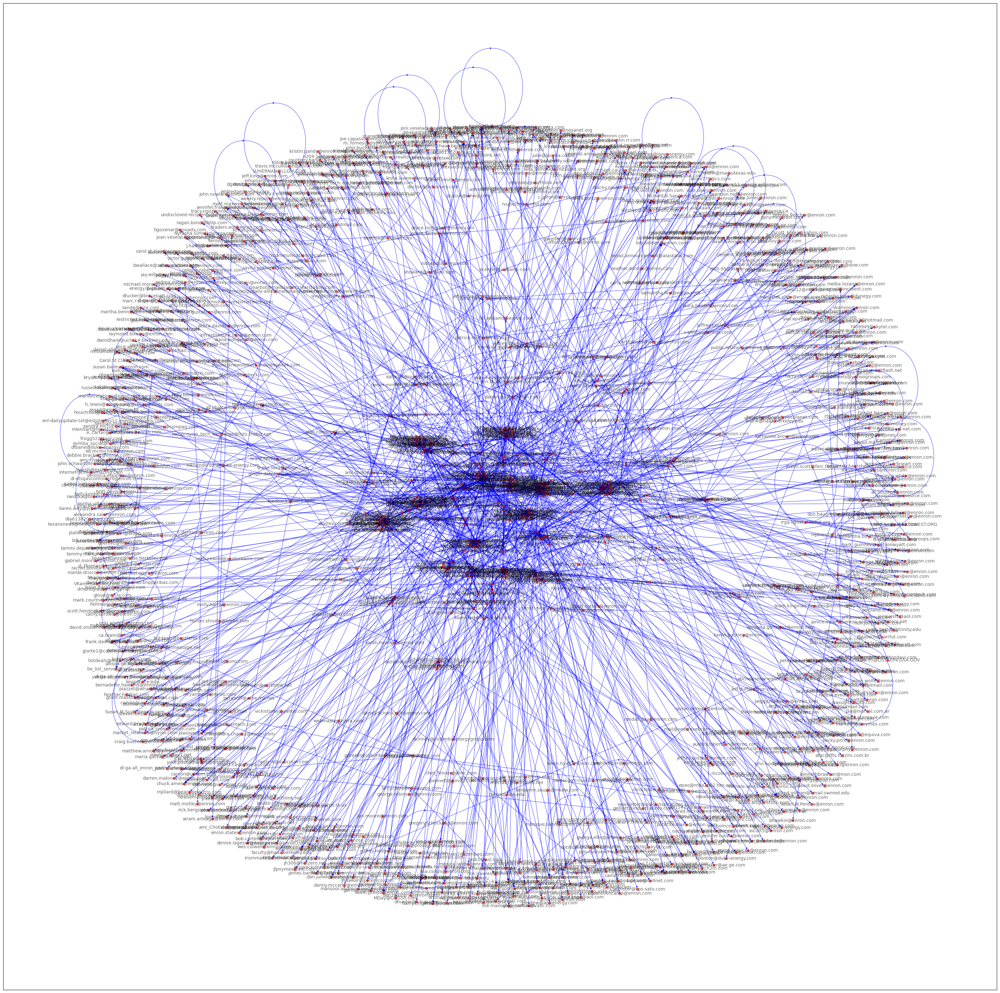

In [31]:
# Extract sender and recipient email addresses from the 'message' column
def extract_email_addresses(message):
    from_email = re.search("From: ([\w\.-]+@[\w\.-]+)", message)
    to_emails = re.findall("To: ([\w\.-]+@[\w\.-]+)", message)
    return (from_email.group(1), to_emails) if from_email else (None, [])

emails[['from_email', 'to_emails']] = emails['message'].apply(lambda x: pd.Series(extract_email_addresses(x)))

# Create the email communication graph
email_graph = nx.DiGraph()

for _, email in emails.iterrows():
    from_email = email['from_email']
    if from_email:
        for to_email in email['to_emails']:
            if email_graph.has_edge(from_email, to_email):
                email_graph[from_email][to_email]['weight'] += 1
            else:
                email_graph.add_edge(from_email, to_email, weight=1)

# Set the weight threshold
weight_threshold = 50

# Remove edges with weights below the threshold
edges_to_remove = [(u, v) for u, v, data in email_graph.edges(data=True) if data['weight'] < weight_threshold]
email_graph.remove_edges_from(edges_to_remove)

# Remove isolated nodes
email_graph.remove_nodes_from(list(nx.isolates(email_graph)))

# Plot the graph
plt.figure(figsize=(40, 40))  # Increased figure size
pos = nx.spring_layout(email_graph, k=0.1)
nx.draw_networkx(email_graph, pos, node_size=25, node_color='red', with_labels=True, edge_color='blue', font_size=10, alpha=0.6, arrowsize=8)  # Increased font size
plt.show()


# The Solution: implement a data science solution to the problem you are trying to solve.

Briefly describe the idea of your solution to the problem in the following cell:

We implement and evaluate various machine learning algorithms (e.g., DBSCAN, K-Means and Agglomerative Clustering etc.) to classify emails as potentially fraudulent or not based on the anomalies and use visualizations, highlighting potentially fraudulent email communications to better understand the patterns and key individuals involved in these activities. By implementing these steps, we aim to develop a robust data-driven approach to detect potential fraudulent activities within the Enron email dataset.

Write codes to implement the solution in python:

In [11]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.preprocessing import StandardScaler

emails_sample = emails.sample(n=5000, random_state=42)
emails_sample['clean_body'] = emails_sample['body'].apply(clean_text)

# Vectorize the text data
vectorizer = TfidfVectorizer(max_df=0.5, min_df=2, stop_words='english')
X = vectorizer.fit_transform(emails_sample['clean_body'])

# Scale the data
scaler = StandardScaler(with_mean=False)
X_scaled = scaler.fit_transform(X)
X_dense = X_scaled.toarray()

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_clusters = dbscan.fit_predict(X_dense)

# Apply K-Means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans_clusters = kmeans.fit_predict(X_dense)

# Apply Agglomerative clustering
agg_clustering = AgglomerativeClustering(n_clusters=5)
agg_clusters = agg_clustering.fit_predict(X_dense)

# Add cluster labels to the dataset
emails_sample['dbscan_cluster'] = dbscan_clusters
emails_sample['kmeans_cluster'] = kmeans_clusters
emails_sample['agg_cluster'] = agg_clusters

# Analyze the clusters
dbscan_anomalies = emails_sample[emails_sample['dbscan_cluster'] == -1]
kmeans_anomalies = emails_sample[emails_sample['kmeans_cluster'] == -1]
agg_anomalies = emails_sample[emails_sample['agg_cluster'] == -1]

print("Number of anomalies detected by DBSCAN:", len(dbscan_anomalies))
print("Number of anomalies detected by K-Means:", len(kmeans_anomalies))
print("Number of anomalies detected by Agglomerative Clustering:", len(agg_anomalies))

/Users/aninda/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Number of anomalies detected by DBSCAN: 4936
Number of anomalies detected by K-Means: 0
Number of anomalies detected by Agglomerative Clustering: 0


In [34]:
# Calculate the distance of each data point from its assigned centroid
distances = []
for i, cluster in enumerate(kmeans_clusters):
    centroid = kmeans.cluster_centers_[cluster]
    distance = np.linalg.norm(X_dense[i] - centroid)
    distances.append(distance)

# Calculate the average distance for each cluster
emails_sample['kmeans_distance'] = distances
average_distances = emails_sample.groupby('kmeans_cluster')['kmeans_distance'].mean()

# Define a threshold for detecting anomalies (e.g., 1.5 times the average distance)
threshold = 1.5
emails_sample['kmeans_anomaly'] = False
for i, row in emails_sample.iterrows():
    cluster = row['kmeans_cluster']
    if row['kmeans_distance'] > threshold * average_distances[cluster]:
        emails_sample.at[i, 'kmeans_anomaly'] = True

kmeans_anomalies = emails_sample[emails_sample['kmeans_anomaly']]
print("Anomalies detected by K-Means by calculating the distance of each data point from its assigned centroid:", len(kmeans_anomalies))


Anomalies detected by K-Means by calculating the distance of each data point from its assigned centroid: 619


In [36]:
# Calculate the average point for each cluster
agg_cluster_groups = emails_sample.groupby('agg_cluster')['clean_body'].apply(list).reset_index()
agg_cluster_groups['avg_point'] = ''

for i, row in agg_cluster_groups.iterrows():
    cluster_texts = row['clean_body']
    cluster_vectors = vectorizer.transform(cluster_texts)
    cluster_vectors_dense = scaler.transform(cluster_vectors).toarray()
    avg_point = np.mean(cluster_vectors_dense, axis=0)
    agg_cluster_groups.at[i, 'avg_point'] = avg_point

# Calculate the distance of each data point from the average point of its assigned cluster
agg_distances = []
for i, row in emails_sample.iterrows():
    cluster = row['agg_cluster']
    avg_point = agg_cluster_groups.loc[cluster]['avg_point']
    index_in_X_dense = emails_sample.index.get_loc(i)
    distance = np.linalg.norm(X_dense[index_in_X_dense] - avg_point)
    agg_distances.append(distance)

# Calculate the average distance for each cluster
emails_sample['agg_distance'] = agg_distances
agg_average_distances = emails_sample.groupby('agg_cluster')['agg_distance'].mean()

# Define a threshold for detecting anomalies (e.g., 1.5 times the average distance)
threshold = 1.5
emails_sample['agg_anomaly'] = False
for i, row in emails_sample.iterrows():
    cluster = row['agg_cluster']
    if row['agg_distance'] > threshold * agg_average_distances[cluster]:
        emails_sample.at[i, 'agg_anomaly'] = True

agg_anomalies = emails_sample[emails_sample['agg_anomaly']]
print("Anomalies detected by Agglomerative by calculating the distance of each data point from its assigned centroid:", len(agg_anomalies))


Anomalies detected by Agglomerative by calculating the distance of each data point from its assigned centroid: 627


In the case of DBSCAN, anomalies are 4936. For K-Means and Agglomerative Clustering, anomalies are not detected initially. Both K-Means and Agglomerative Clustering do not inherently detect anomalies; they only assign data points to clusters. DBSCAN, on the other hand, explicitly labels data points as anomalies if they do not belong to any cluster. To identify potential anomalies using K-Means and Agglomerative Clustering, you could analyze the distance of each data point from the centroid of its assigned cluster. Data points with a distance significantly greater than the average distance for their respective cluster could be considered anomalies. 
This solution is designed to identify potential anomalies in the email dataset using unsupervised machine learning techniques. It helps in detecting unusual patterns or outliers, which could be indicative of fraud, spam, or other abnormal behavior.

# Results: summarize and visualize the results discovered from the analysis

Please use figures or tables to present the results.


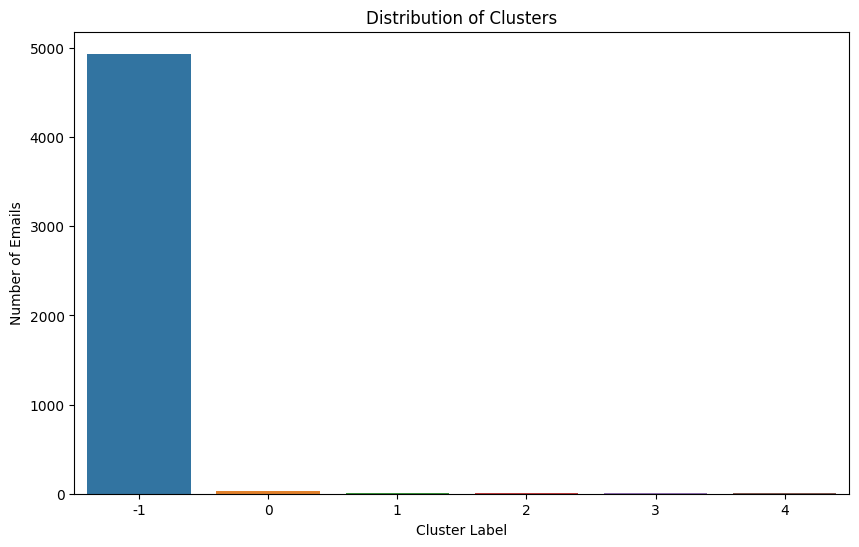

In [15]:
# Your code starts here
#   Please add comments or text cells in between to explain the general idea of each block of the code.
#   Please feel free to add more cells below this cell if necessary
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the distribution of clusters
plt.figure(figsize=(10, 6))
sns.countplot(x='dbscan_cluster', data=emails_sample)
plt.title('Distribution of Clusters')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Emails')
plt.show()


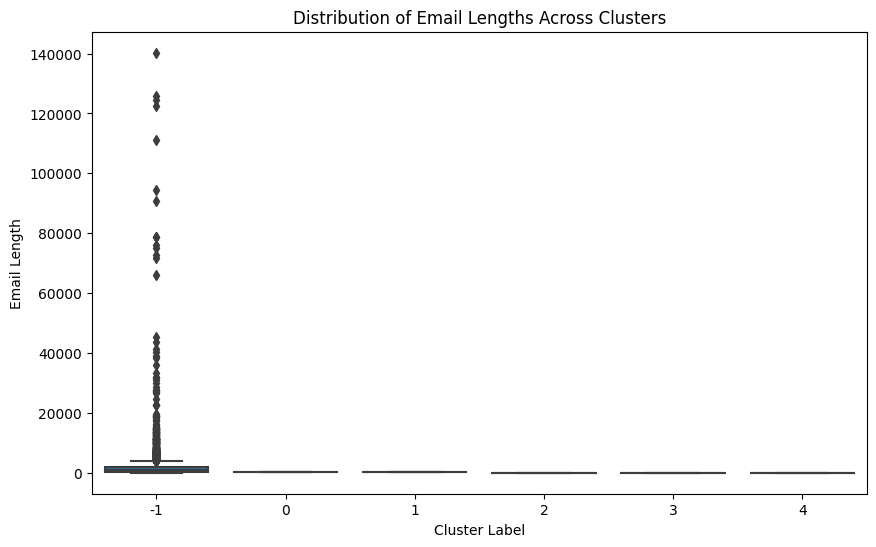

In [16]:
# Visualize the distribution of email lengths across clusters
emails_sample['email_length'] = emails_sample['clean_body'].apply(lambda x: len(x))

plt.figure(figsize=(10, 6))
sns.boxplot(x='dbscan_cluster', y='email_length', data=emails_sample)
plt.title('Distribution of Email Lengths Across Clusters')
plt.xlabel('Cluster Label')
plt.ylabel('Email Length')
plt.show()


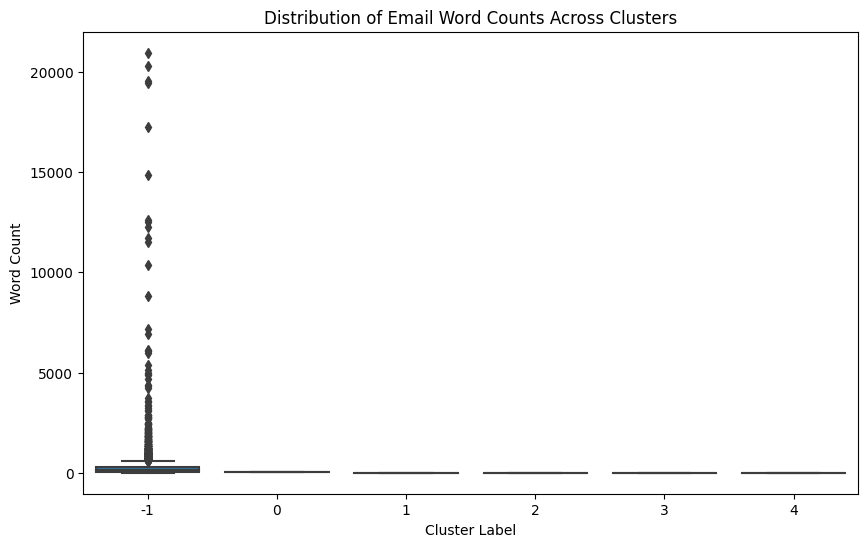

In [17]:
# Visualize the distribution of email word counts across clusters
emails_sample['word_count'] = emails_sample['clean_body'].apply(lambda x: len(x.split()))

plt.figure(figsize=(10, 6))
sns.boxplot(x='dbscan_cluster', y='word_count', data=emails_sample)
plt.title('Distribution of Email Word Counts Across Clusters')
plt.xlabel('Cluster Label')
plt.ylabel('Word Count')
plt.show()

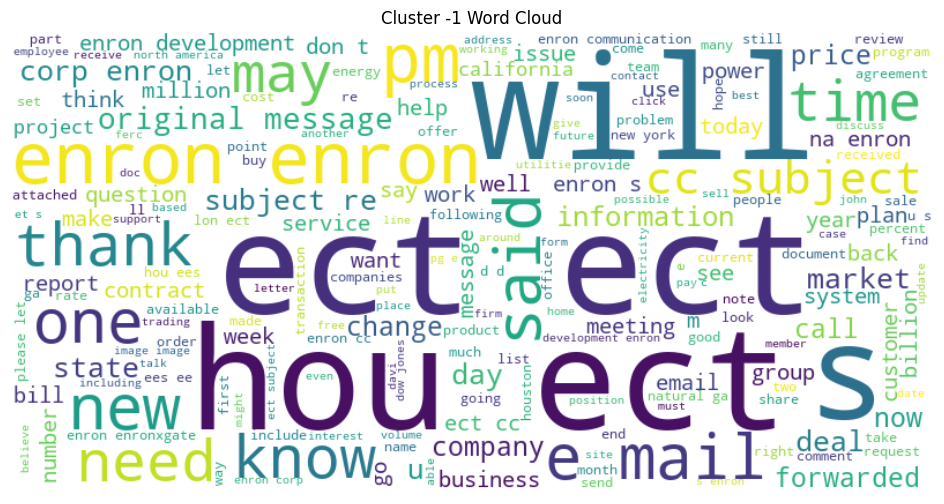

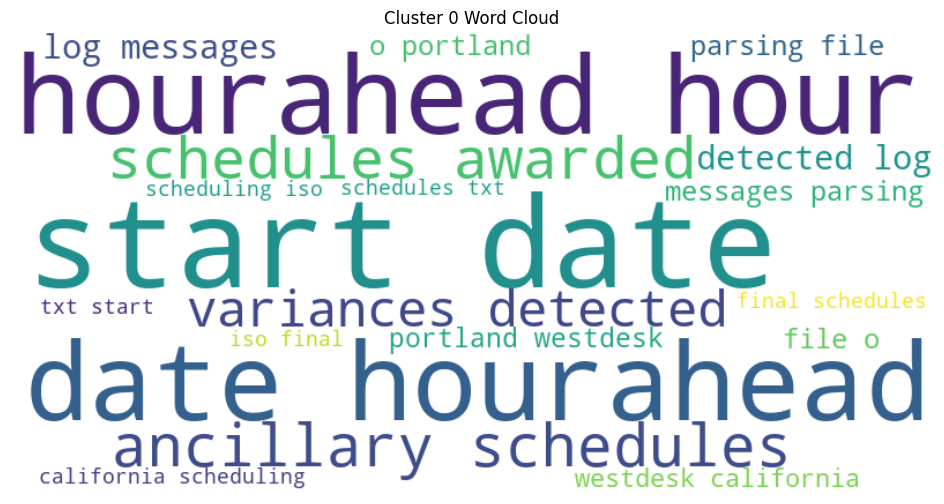

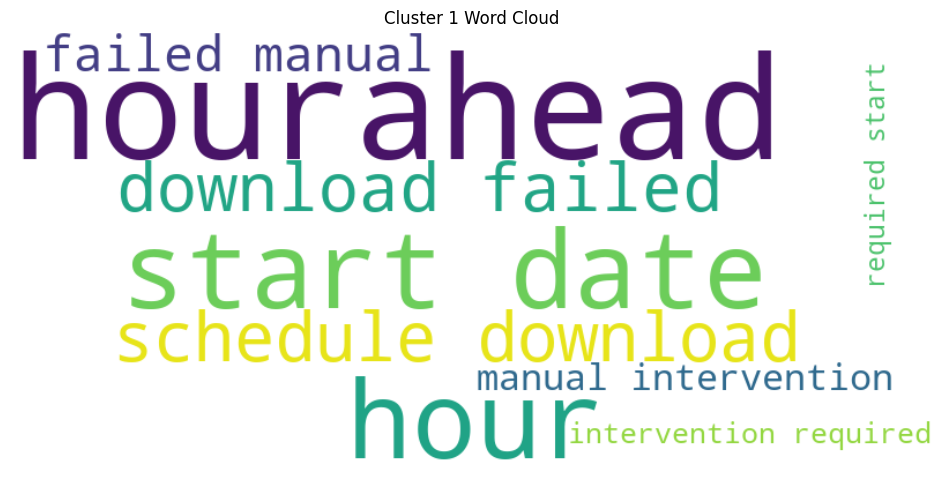

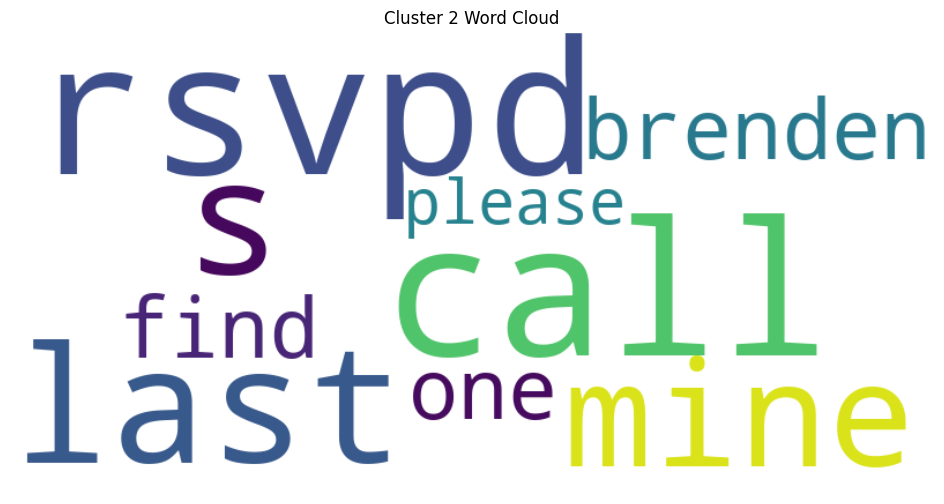

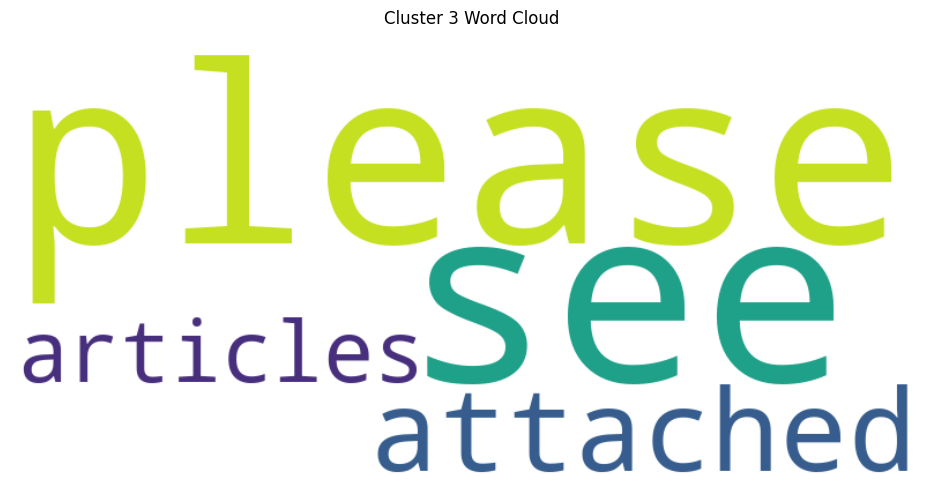

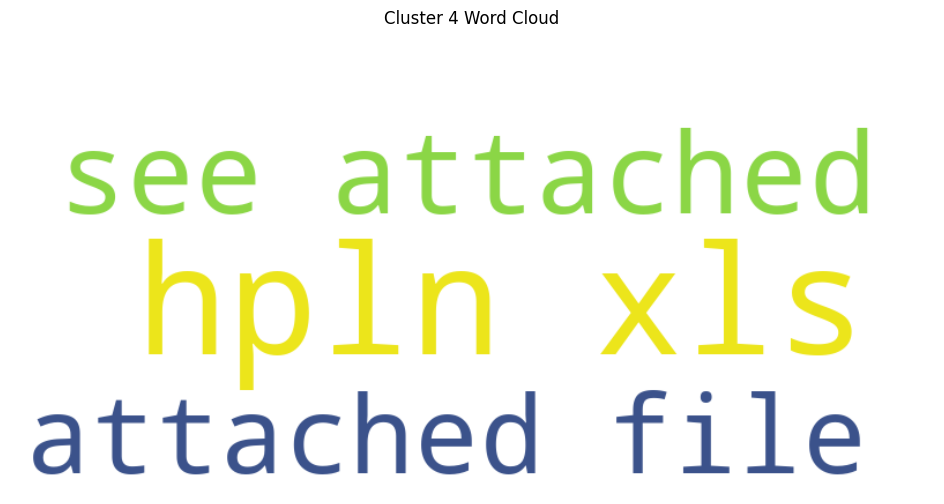

In [22]:
#Visualize the most frequent words in each cluster:
from wordcloud import WordCloud

def display_wordcloud(dbscan_cluster):
    cluster_emails = emails_sample[emails_sample['dbscan_cluster'] == cluster]['clean_body']
    text = ' '.join(cluster_emails.values)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Cluster {cluster} Word Cloud')
    plt.show()

unique_clusters = emails_sample['dbscan_cluster'].unique()

for cluster in unique_clusters:
    display_wordcloud(cluster)



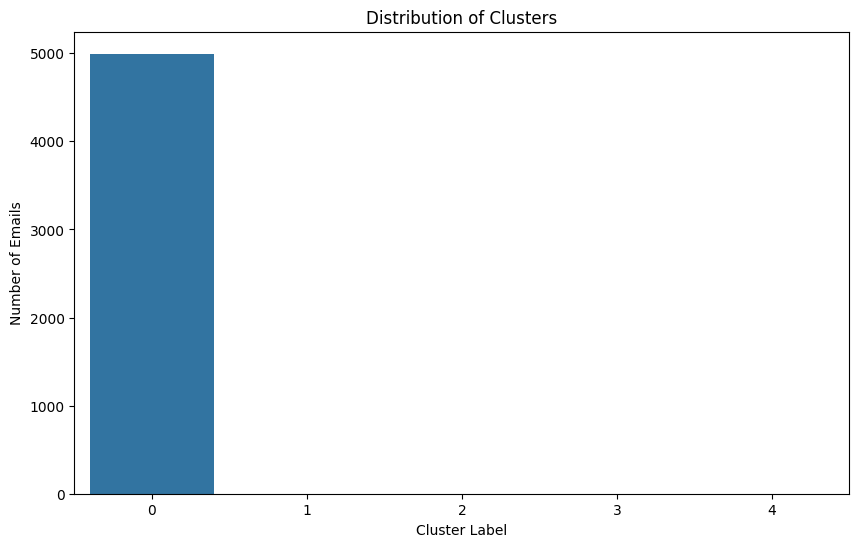

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the distribution of clusters in kmeans
plt.figure(figsize=(10, 6))
sns.countplot(x='kmeans_cluster', data=emails_sample)
plt.title('Distribution of Clusters')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Emails')
plt.show()

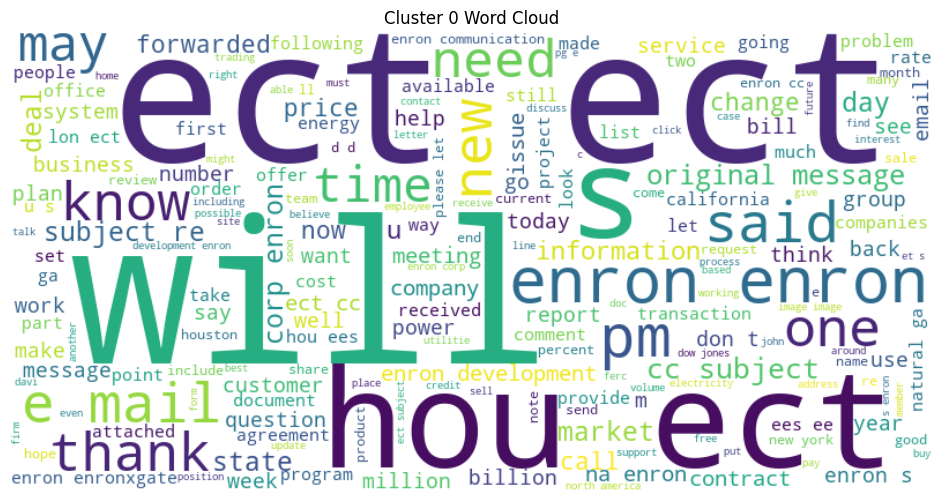

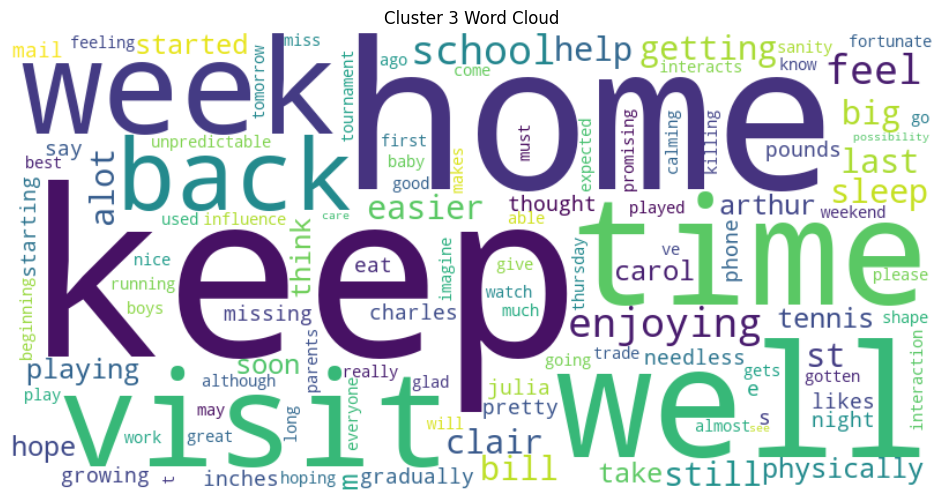

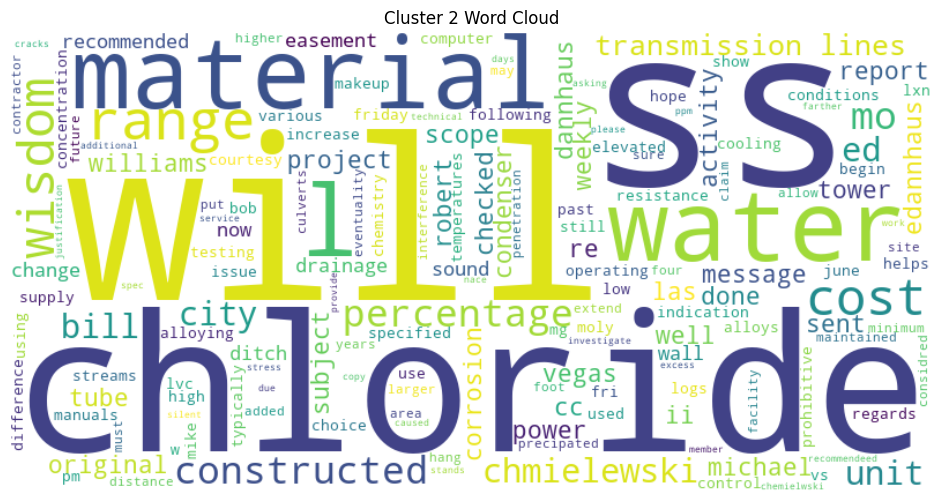

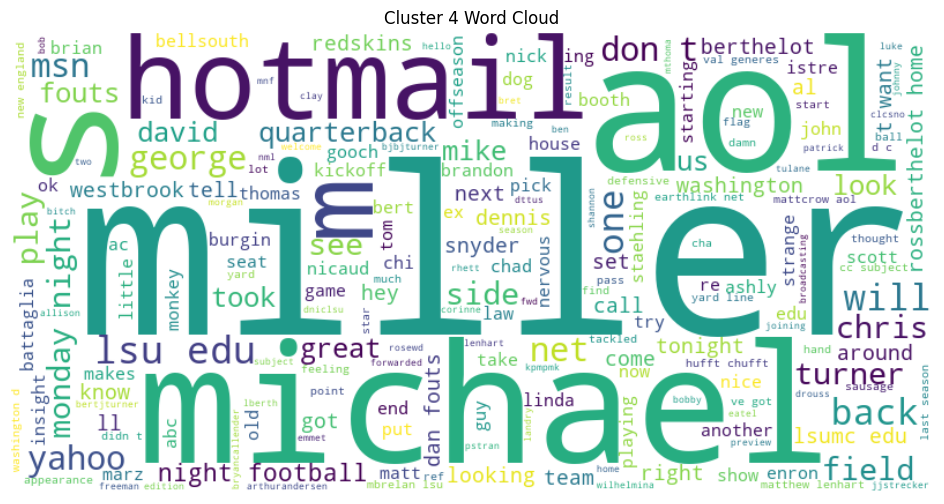

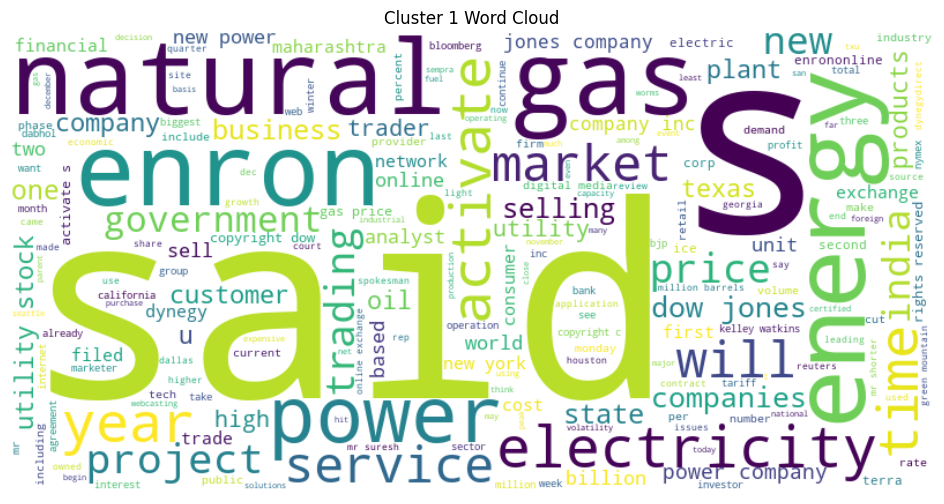

In [24]:
#Visualize the most frequent words in each cluster of kmeans:
from wordcloud import WordCloud

def display_wordcloud(kmeans_cluster):
    cluster_emails = emails_sample[emails_sample['kmeans_cluster'] == cluster]['clean_body']
    text = ' '.join(cluster_emails.values)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Cluster {cluster} Word Cloud')
    plt.show()

unique_clusters = emails_sample['kmeans_cluster'].unique()

for cluster in unique_clusters:
    display_wordcloud(cluster)

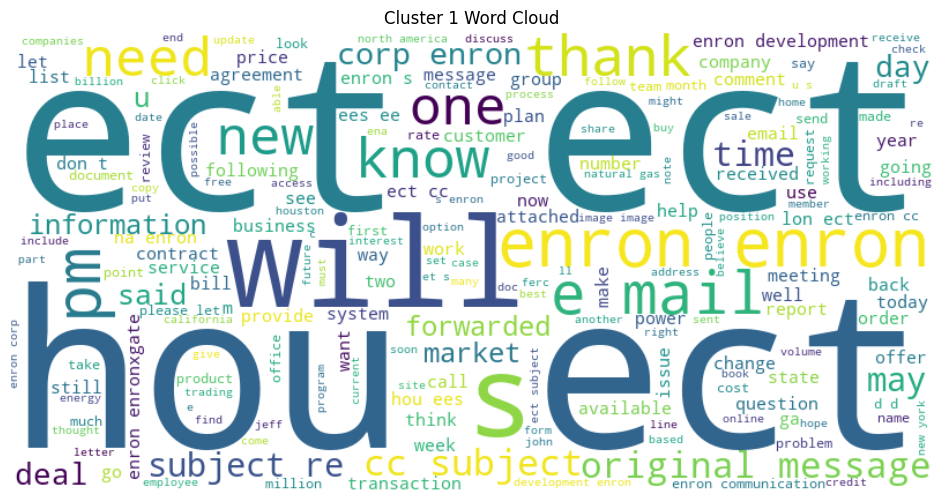

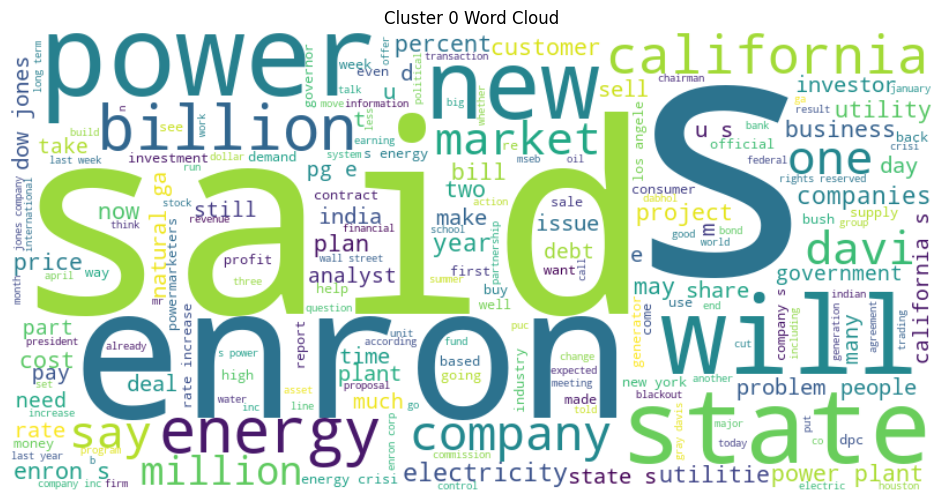

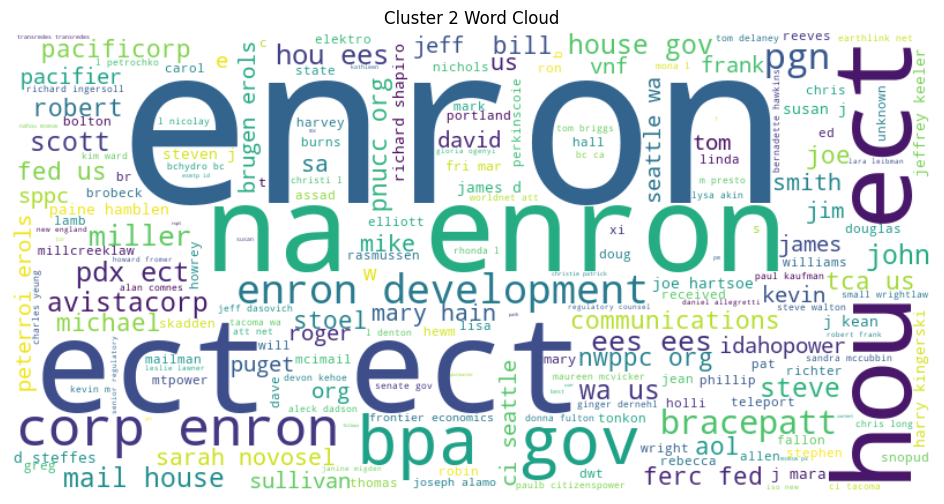

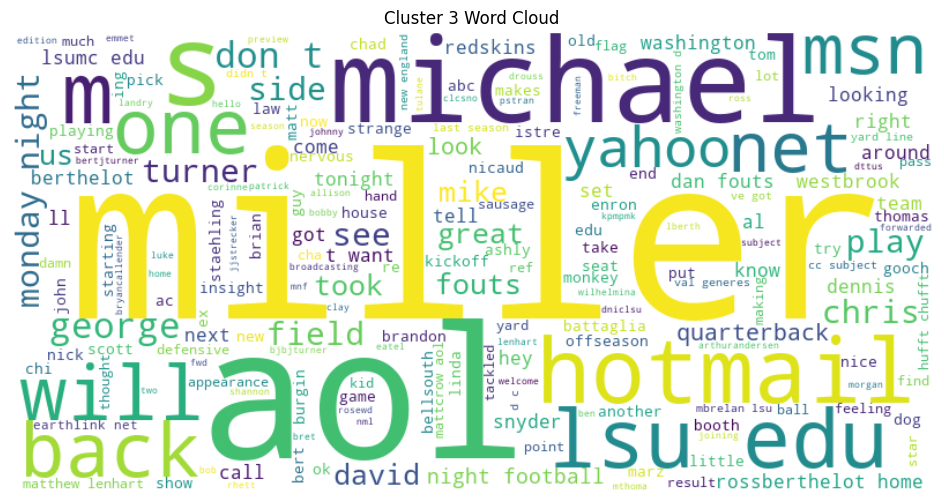

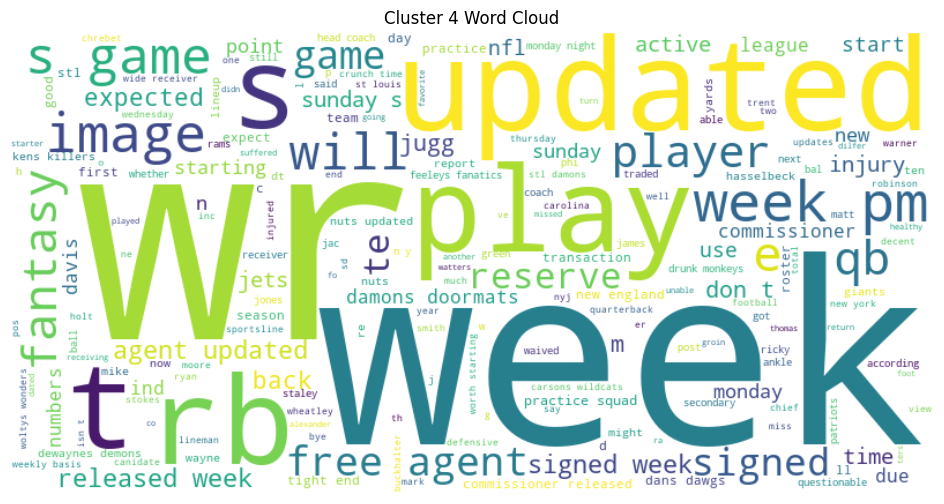

In [26]:
#Visualize the most frequent words in each cluster of Agglomerative Clustering:
from wordcloud import WordCloud

def display_wordcloud(agg_cluster):
    cluster_emails = emails_sample[emails_sample['agg_cluster'] == cluster]['clean_body']
    text = ' '.join(cluster_emails.values)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Cluster {cluster} Word Cloud')
    plt.show()

unique_clusters = emails_sample['agg_cluster'].unique()

for cluster in unique_clusters:
    display_wordcloud(cluster)

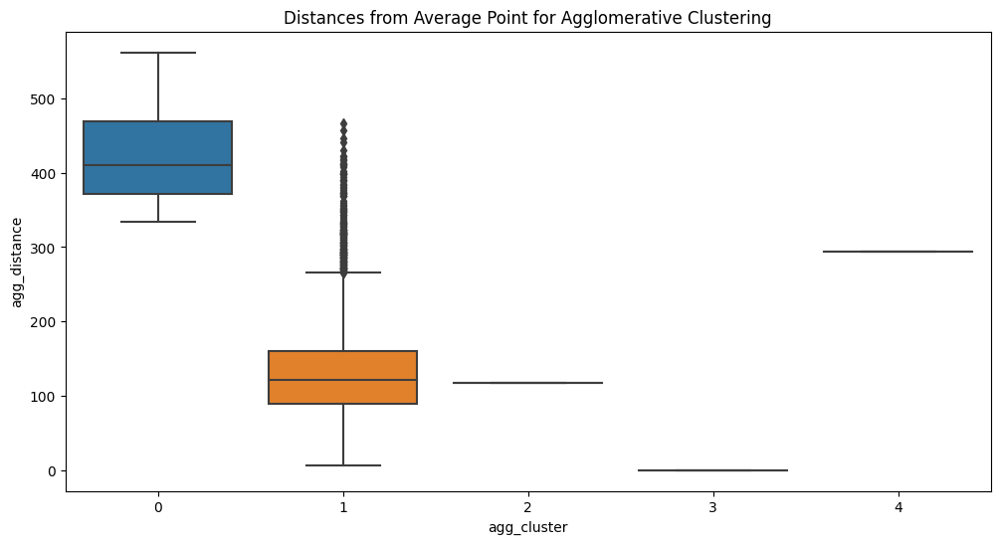

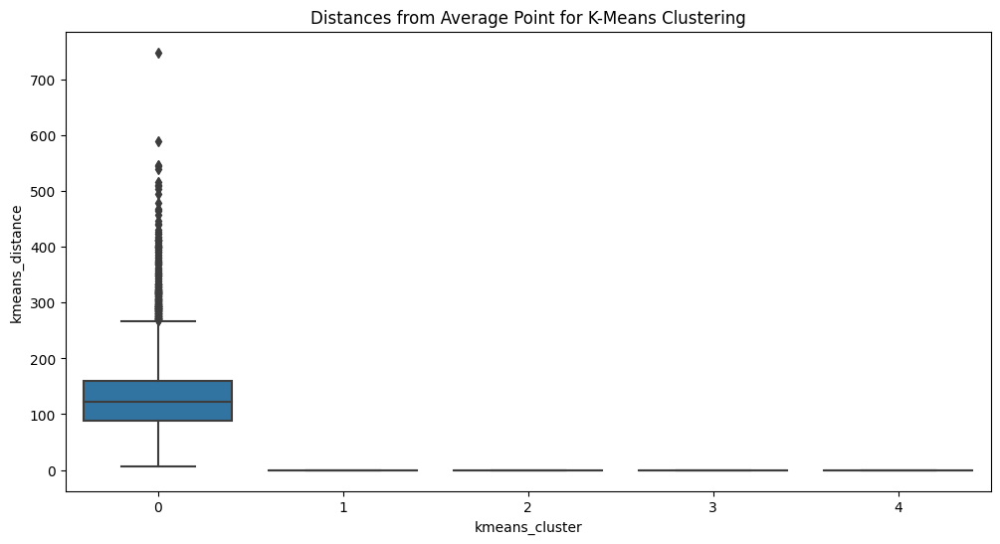

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize the distances for Agglomerative Clustering
plt.figure(figsize=(12, 6))
sns.boxplot(x='agg_cluster', y='agg_distance', data=emails_sample)
plt.title('Distances from Average Point for Agglomerative Clustering')
plt.show()

# Visualize the distances for K-Means Clustering
plt.figure(figsize=(12, 6))
sns.boxplot(x='kmeans_cluster', y='kmeans_distance', data=emails_sample)
plt.title('Distances from Average Point for K-Means Clustering')
plt.show()


DBSCAN (Density-Based Spatial Clustering of Applications with Noise) is a density-based clustering algorithm that identifies clusters by grouping together points that are closely packed based on a density criterion. On the other hand, K-Means and Agglomerative Clustering are centroid-based and hierarchical clustering algorithms, respectively. Points that are not part of any cluster are treated as noise and considered anomalies.By comparing the clustering results, we can identify instances that consistently appear as outliers across different methods. This provides a more robust and reliable way of detecting anomalies, as it reduces the reliance on a single clustering technique. In many cases, anomalies can be indicative of malicious activities. Identifying these instances early on can help organizations to implement appropriate countermeasures and minimize the potential negative impact on their business. For example-identifying spam emails and fraud detection

*-----------------
# Done

All set! 

** What do you need to submit?**

* **Notebook File**: Save this Jupyter notebook, and submit it in BrightSpace. Please make sure all the plotted tables and figures are in the notebook. 